## Imports

In [27]:
import sys
sys.path.append("../src")

import pandas as pd
import numpy as np
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns





In [ ]:
df = pd.read_csv("../data/01_raw/en.openfoodfacts.org.products.tsv", sep="\t", low_memory=False)
print("Imports done!")

In [52]:
dfx = pd.read_csv("../data/02_intermediate/foodflix.csv")

In [53]:
dfx.head(1)

,Unnamed: 0,product_name,brands,categories,ingredients_text,allergens,nutrition-score-fr_100g,nutrition_grade_fr,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,content
0,185,Root Beer,A&W,"Boissons,Boissons gazeuses,Sodas,Boissons sucr...","Eau gazéifiée, sirop de maïs à haute teneur en...",Non Renseigné,18.0,E,215.0,0.0,0.0,14.2,13.6,0.0,0.0,0.0616,"root beer // a&w // boissons,boissons gazeuses..."


## Quelques infos sur la DataFrame

In [5]:
print("Taille de la table : {} lignes et {} colonnes.".format(
    df.shape[0], df.shape[1])
)
df.sample(3)

Taille de la table : 356027 lignes et 163 colonnes.


,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,fruits-vegetables-nuts_100g,fruits-vegetables-nuts-estimate_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
233525,3274661106884,http://world-en.openfoodfacts.org/product/3274...,kiliweb,1497785686,2017-06-18T11:34:46Z,1497785694,2017-06-18T11:34:54Z,Glaces vanille & chocolat au lait Disney,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,-1.0,NaN,NaN
259544,3564700347737,http://world-en.openfoodfacts.org/product/3564...,sebleouf,1448732751,2015-11-28T17:45:51Z,1451157770,2015-12-26T19:22:50Z,Maxi Poulet rôti Crudités,Sandwich pain demie complet poulet rôti traité...,200 g,...,NaN,NaN,NaN,NaN,NaN,NaN,-2.0,-2.0,NaN,NaN
52120,0041570089767,http://world-en.openfoodfacts.org/product/0041...,usda-ndb-import,1489139878,2017-03-10T09:57:58Z,1489139879,2017-03-10T09:57:59Z,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN


## Visualisation du pourcentage de valeurs manquantes

In [6]:
msno.matrix(df)

<AxesSubplot:>

In [1]:
def msv1(data, thresh=20, color='black', edgecolor='black', width=15, height=3):

    plt.figure(figsize=(width,height))
    percentage=(data.isnull().mean())*100
    percentage.sort_values(ascending=False).plot.bar(color=color, edgecolor=edgecolor)
    plt.axhline(y=thresh, color='r', linestyle='-')
    plt.title('Missing values percentage per column', fontsize=20, weight='bold' )
    plt.text(len(data.isnull().sum()/len(data))/1.7, thresh+12.5, 'Columns with more than %s%s missing values' %(thresh, '%'), fontsize=12,weight='bold', color='crimson',
         ha='left' ,va='top')
    plt.text(len(data.isnull().sum()/len(data))/1.7, thresh - 5, 'Columns with less than %s%s missing values' %(thresh, '%'), fontsize=12,weight='bold', color='blue',
         ha='left' ,va='top')
    plt.xlabel('Columns', size=15, weight='bold')
    plt.ylabel('Missing values percentage', weight='bold')
    plt.yticks(weight ='bold')
    
    return plt.show()

msv1(df,90, color=('silver', 'gainsboro', 'lightgreen', 'white', 'lightpink'), width=28, height=3)


NameError: name 'df' is not defined

## Sélection des entrées concernant uniquement en France

In [87]:
# Vérification de la consistence des données de "countries"
print(df["countries"].value_counts())
print("Plusieurs termes sont utilisés pour définir la France")

# Uniformisation des lignes concernant la France
df["countries"].str.replace(r".*(fr).*", "France", case=False, regex=True)

# Réduction du DataFrame à la France
df = df[df["countries"] == "France"]

US                                           169789
France                                       106296
en:FR                                         16056
Suisse                                        12003
Deutschland                                    6900
                                              ...  
UK,France,Belgium                                 1
Australie,Belgique,France, en:switzerland         1
France,Hungary,Romania                            1
Martinique, en:france                             1
Spain,Italy,Portugal                              1
Name: countries, Length: 1637, dtype: int64
Plusieurs termes sont utilisés pour définir la France


## Retrait des lignes sans nom de produit

In [88]:
print(df.product_name.isna().value_counts())
df = df[df.product_name.notna()]

False    105094
True       1202
Name: product_name, dtype: int64


## Sélection des colonnes pertinentes

In [89]:
df = df[
    [
        'product_name',
        'image_small_url',
        'brands',
        'categories',
        'ingredients_text',
        'allergens',
        'nutrition-score-fr_100g',
        'nutrition_grade_fr',
        'energy_100g',
        'fat_100g',
        'saturated-fat_100g',
        'carbohydrates_100g',
        'sugars_100g',
        'fiber_100g',
        'proteins_100g',
        'salt_100g'
    ]
]

## Recherche et suppression de doublons

In [90]:
print(df.duplicated().value_counts())
df.drop_duplicates(inplace=True)

False    104932
True        162
dtype: int64


## Recherche de données abérantes en ce qui concerne les valeurs énergétiques et traitement de ces données

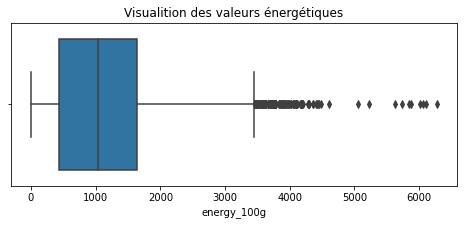

In [91]:
plt.figure(figsize=(8,3))
plt.title("Visualition des valeurs énergétiques")
ax = sns.boxplot(x = df['energy_100g'])

# La valeur énergétique maximale que l'on peut atteindre est d'environ 3700 Kj
df= df[df["energy_100g"] <= 3700]   

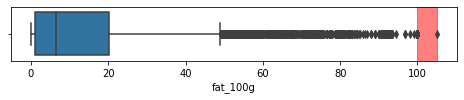

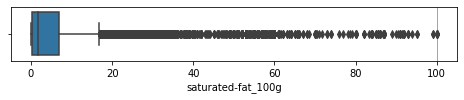

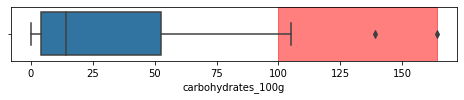

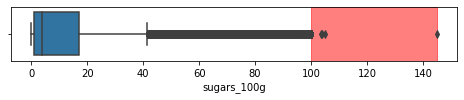

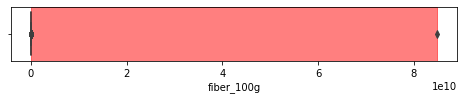

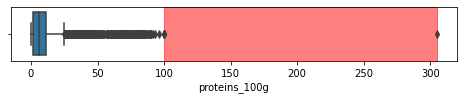

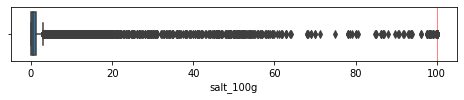

In [92]:
cols = [
    'fat_100g',
    'saturated-fat_100g',
    'carbohydrates_100g',
    'sugars_100g',
    'fiber_100g',
    'proteins_100g',
    'salt_100g',
]


for col in cols:
    xmax = df[col].max()
    if xmax <= 100:
        xmax = 100
    plt.figure(figsize=(8,1))
    plt.axvspan(100,df[col].max(), color='red', alpha=0.5)
    sns.boxplot(x=col, data=df[cols])

## Retrait des valeurs abérantes ( au delà de 100g / 100g)

In [93]:
for col in df[cols]:
    df = df[df[col] <= 100]


## Vérification après retrait des valeurs

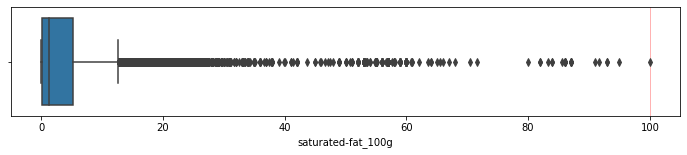

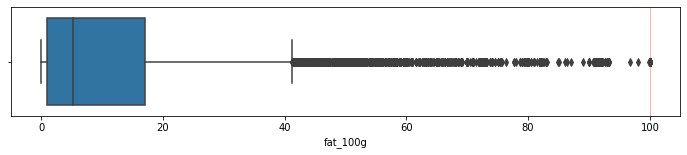

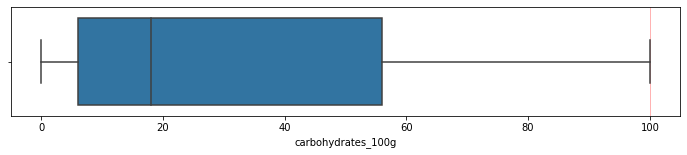

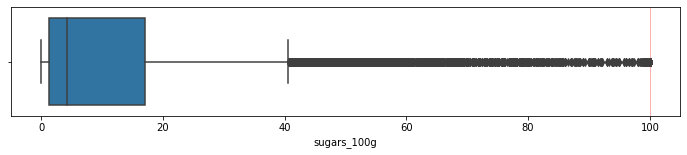

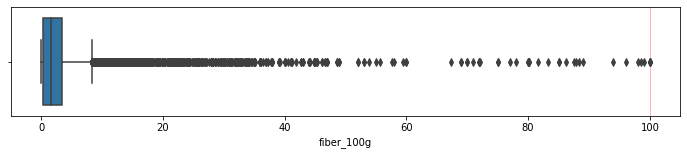

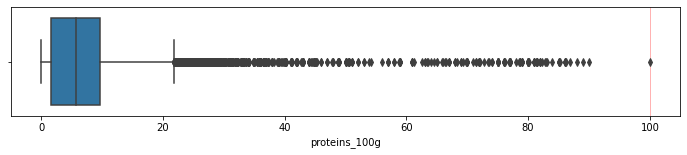

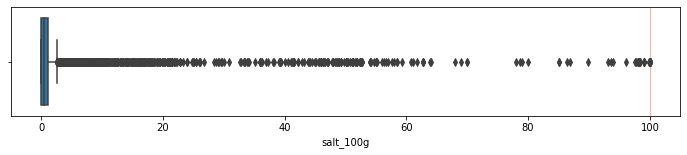

In [94]:
cols = [
    'saturated-fat_100g',
    'fat_100g',
    'carbohydrates_100g',
    'sugars_100g',
    'fiber_100g',
    'proteins_100g',
    'salt_100g',
]

for col in cols:
    xmax = df[col].max()
    if xmax <= 100:
        xmax = 100
    plt.figure(figsize=(12,2))
    plt.axvspan(100, xmax, color='red', alpha=0.3)
    sns.boxplot(x=col, data=df[cols])


In [95]:
## Traitement des valeurs manquantes

In [96]:
cols =  [
    'energy_100g',
    'fat_100g',
    'saturated-fat_100g',
    'carbohydrates_100g',
    'sugars_100g',
    'fiber_100g',
    'proteins_100g',
    'salt_100g',
]
for col in cols:
    df[col].fillna(0.0, inplace=True)
    
cols2 = [
    "categories",
    "ingredients_text",
    "allergens",
    "nutrition_grade_fr",
    'nutrition-score-fr_100g',
    "brands"
]
for col in cols2:
    df[col].fillna("Non renseigné", inplace=True)

## visualisation finale avec missingno

<AxesSubplot:>

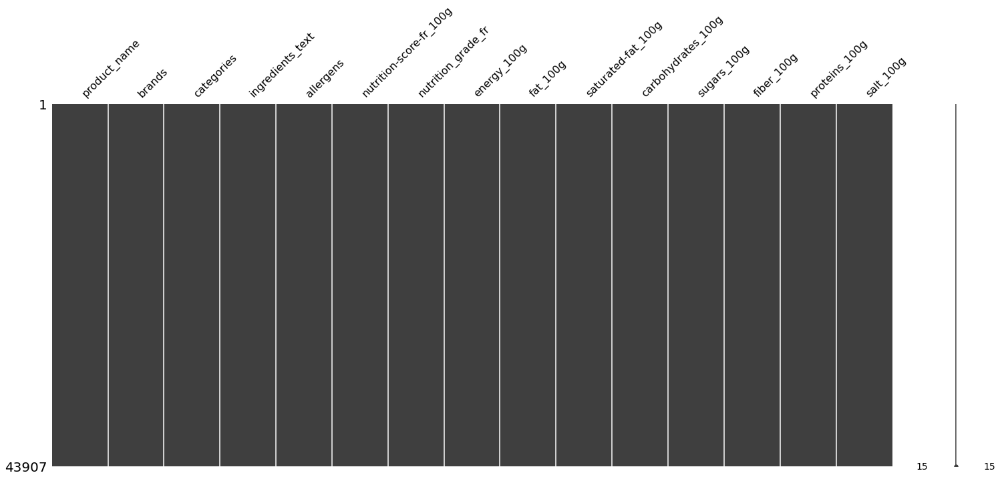

In [97]:
msno.matrix(df)

In [98]:
print("Taille de la table : {} lignes et {} colonnes.".format(
    df.shape[0], df.shape[1])
)

Taille de la table : 43907 lignes et 15 colonnes.


In [99]:
# Clear notebook's memory
#%reset -f

# Analyse et recherche de corrélation (post-brief)

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

from IPython.display import Image



df_0 = pd.read_csv("../data/02_intermediate/foodflix.csv")
pd.set_option('display.float_format','{:.2f}'.format)

cols =  [
    'energy_100g',
    'fat_100g',
    'saturated-fat_100g',
    'carbohydrates_100g',
    'sugars_100g',
    'fiber_100g',
    'proteins_100g',
    'salt_100g',
]
df = df_0[cols]
print("Imports done!")
df.shape



Imports done!


(43907, 8)

In [3]:
folder = 'plots/'
files = os.listdir(folder)

def make_pairplots(data, name, override=False):
    filename = "pairplots_{}.jpg".format(name)
    path = "./{}{}".format(folder, filename)

    if override or filename not in files:
        print("Saving...")
        g = sns.pairplot(data=data, height=2.5, corner=True)
        g.savefig(path)
        print("Saved as {} in folder {}".format(filename,path))
        plt.clf();
    else:
        print("File already exist")
    display(Image(filename=path))


def list_plots():
    print("Visualization files in /plots :")
    for f in files:
        print('- ',f[10:])

list_plots()

Visualization files in /plots :
-  sample_10000.jpg
-  sample_full_corner.jpg
-  sample_full.jpg


In [4]:
df.corr()

,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g
energy_100g,1.00,0.76,0.58,0.58,0.35,0.25,0.30,-0.02
fat_100g,0.76,1.00,0.73,-0.02,0.04,0.09,0.18,0.01
saturated-fat_100g,0.58,0.73,1.00,0.02,0.15,0.02,0.13,-0.00
carbohydrates_100g,0.58,-0.02,0.02,1.00,0.58,0.20,-0.02,-0.06
sugars_100g,0.35,0.04,0.15,0.58,1.00,0.03,-0.20,-0.08
fiber_100g,0.25,0.09,0.02,0.20,0.03,1.00,0.20,-0.01
proteins_100g,0.30,0.18,0.13,-0.02,-0.20,0.20,1.00,0.05
salt_100g,-0.02,0.01,-0.00,-0.06,-0.08,-0.01,0.05,1.00


File already exist


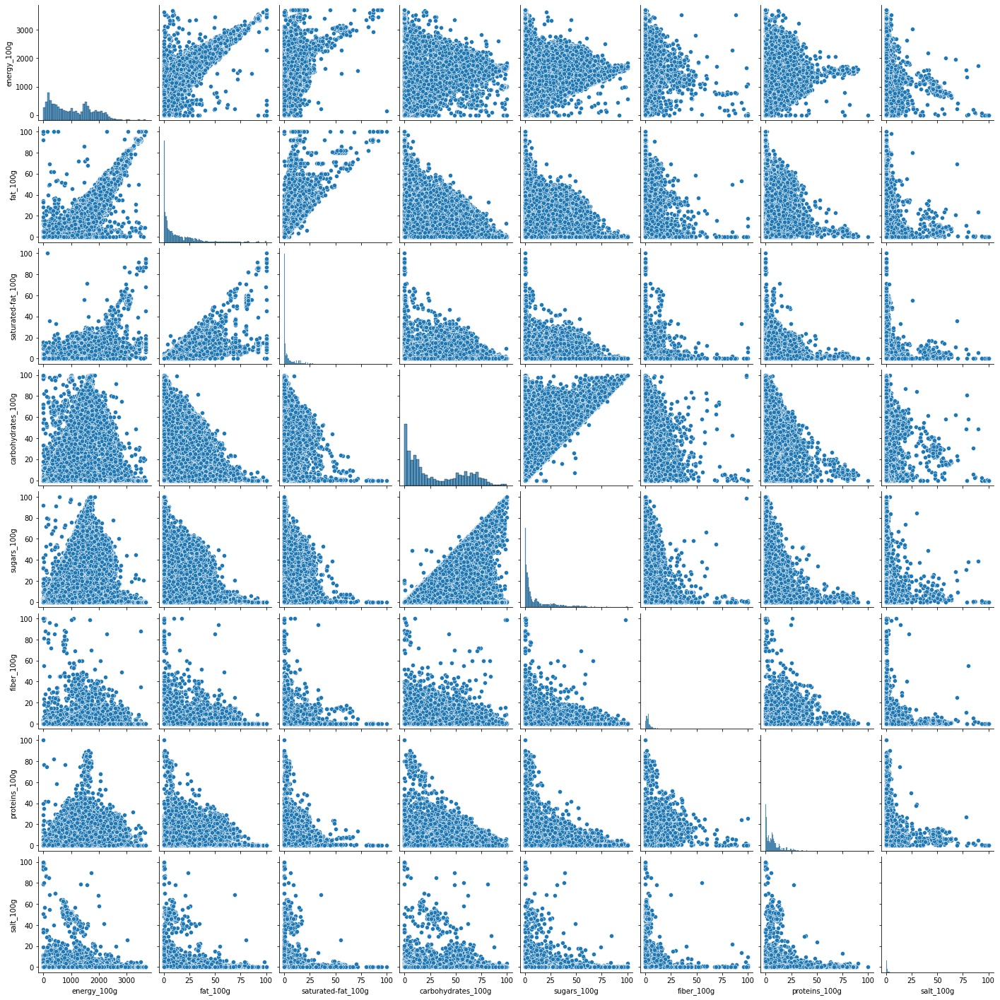

In [5]:
make_pairplots(df, "sample_full")

### Réaliser une Heatmap

<AxesSubplot:>

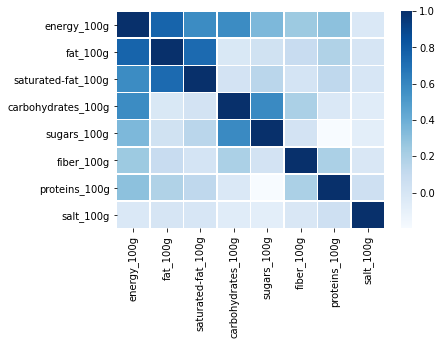

In [6]:
plt.figure(figsize=(6, 4))
sns.heatmap(df.corr(), linewidths=.5, cmap="Blues")

In [7]:
df_features = [
    'fat_100g',
    'carbohydrates_100g',
    'proteins_100g',
]

In [13]:
X = df_0[df_features]
y = df_0["energy_100g"]

In [14]:
from sklearn.linear_model import LinearRegression

reg = LinearRegression().fit(X,y)

In [15]:
reg.coef_

array([36.84171604, 16.60674041, 17.38344601])

In [16]:
df_0["predict_energy_100g"] = reg.predict(X)


<AxesSubplot:xlabel='energy_100g', ylabel='predict_energy_100g'>

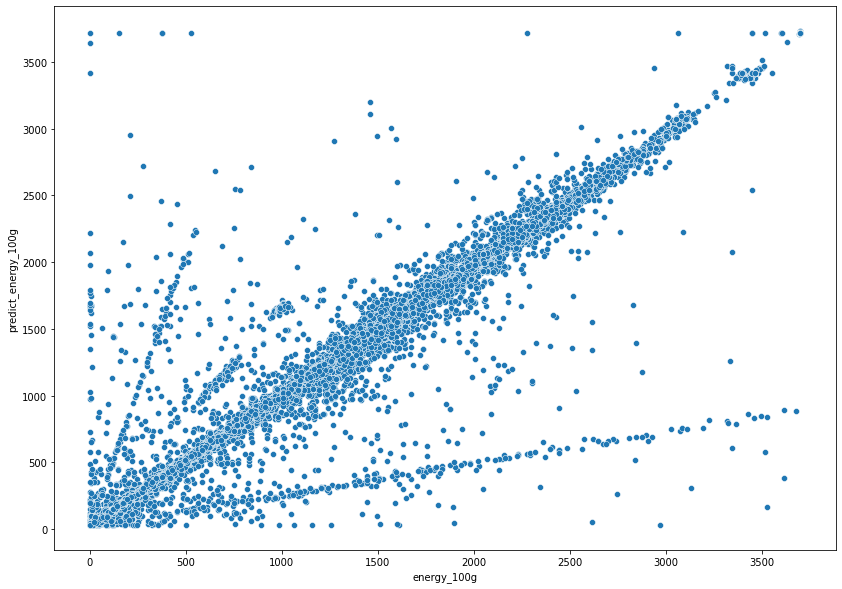

In [17]:
plt.figure(figsize=(14,10))
sns.scatterplot(data=df_0, x="energy_100g", y="predict_energy_100g")